<a href="https://colab.research.google.com/github/ritwikraha/CV-Practice/blob/master/Image_Inpainting_Img2Img.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Inpainting with Img2Img inside `Diffusers`

In [1]:
!pip install diffusers -qq
!pip install accelerate -qq

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.7/265.7 kB 4.4 MB/s eta 0:00:00


In [2]:
import torch
from diffusers import AutoPipelineForInpainting, AutoPipelineForImage2Image
from diffusers.utils import load_image, make_image_grid

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [3]:
pipeline = AutoPipelineForInpainting.from_pretrained(
    "diffusers/stable-diffusion-xl-1.0-inpainting-0.1", torch_dtype=torch.float16, variant="fp16"
)
pipeline.enable_model_cpu_offload()

# load base and mask image
init_image = load_image("https://i.imgur.com/84JlFHp.png")
mask_image = load_image("https://i.imgur.com/izAVzwj.png")

model_index.json:   0%|          | 0.00/690 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/746 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/758 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.93k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/659 [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'decay': 0.9999, 'inv_gamma': 1.0, 'min_decay': 0.0, 'optimization_step': 37000, 'power': 0.6666666666666666, 'update_after_step': 0, 'use_ema_warmup': False} were passed to UNet2DConditionModel, but are not expected and will be ignored. Please verify your config.json configuration file.


In [4]:
prompt = "illustration of the side profile of wonder woman in the new52 costume throwing a punch with her right hand, with an intense face, comic book style highly detailed, 8k"
negative_prompt = "bad anatomy, disfigured faces, disfigured hands, extra digits"
image_inpainting = pipeline(prompt=prompt, negative_prompt=negative_prompt, image=init_image, mask_image=mask_image,  strength=0.9).images[0]

# resize image to 1024x1024 for SDXL
image_inpainting = image_inpainting.resize((1024, 1024))

  0%|          | 0/45 [00:00<?, ?it/s]

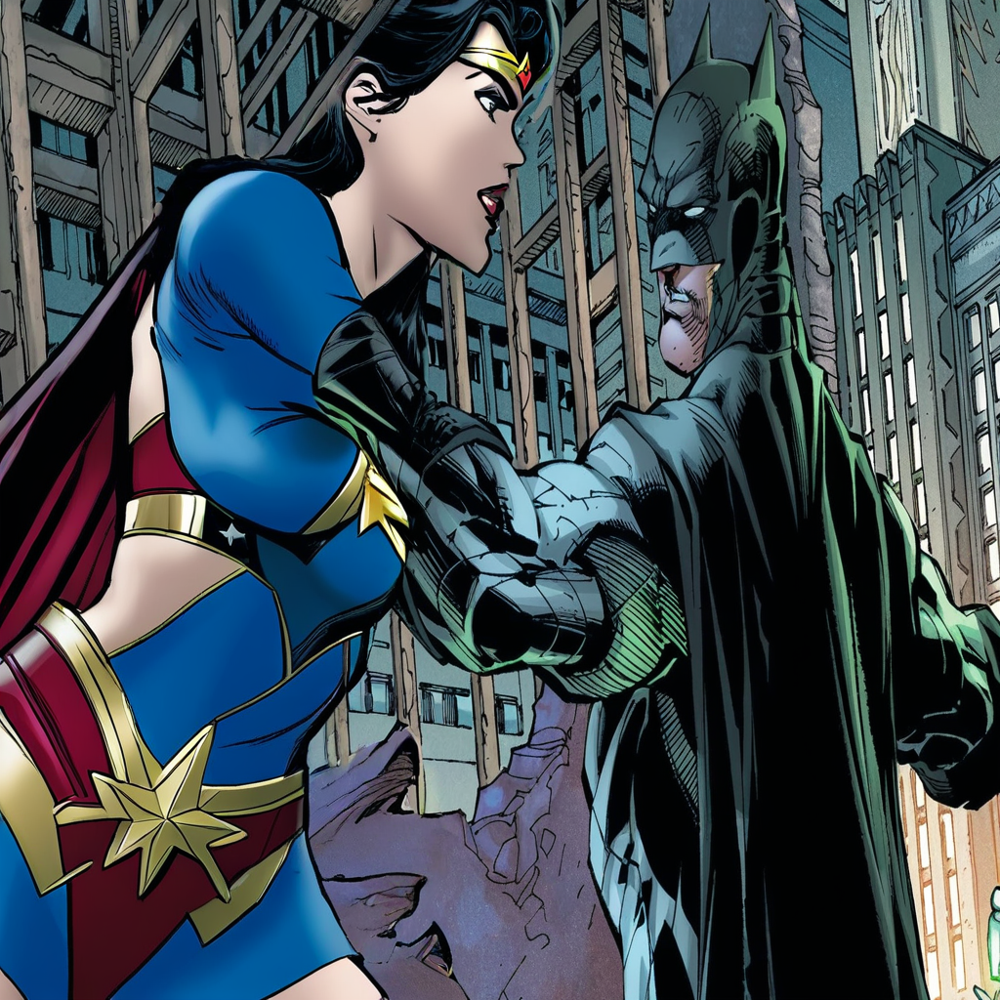

In [5]:
image_inpainting

In [6]:
pipeline = AutoPipelineForInpainting.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16"
)
pipeline.enable_model_cpu_offload()


image = pipeline(prompt=prompt, image=image_inpainting, mask_image=mask_image, output_type="latent").images[0]

model_index.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.71k [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/4.52G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

In [ ]:
image

tensor([[[-0.2747, -0.0878, -0.8218,  ..., -0.2783, -0.1210,  0.0498],
         [-0.4404,  0.2333,  0.1255,  ..., -0.0179,  0.1515, -0.1898],
         [-0.6787,  0.2559, -1.0986,  ...,  0.4133,  0.0418, -0.0365],
         ...,
         [-1.2764, -0.7310, -1.0996,  ...,  0.7852,  0.6948,  0.3950],
         [-1.1982, -1.5078, -1.3066,  ...,  1.2119,  1.1113,  1.7539],
         [-0.7427, -0.8311, -0.9854,  ...,  1.1035,  0.6021,  0.4358]],

        [[ 0.0898, -0.1677,  0.6040,  ...,  0.0044,  0.6279,  0.9507],
         [ 0.2131,  0.4724,  0.7212,  ...,  0.7632,  0.1857, -0.1836],
         [-0.7769,  1.1553, -0.2529,  ...,  1.5820,  0.5005,  0.3455],
         ...,
         [-0.5015, -0.1240, -0.5356,  ..., -1.4766, -0.7344, -0.6831],
         [-0.5825, -0.7061, -0.6489,  ..., -0.1825, -0.4053,  1.6465],
         [ 0.0263,  0.2294, -0.7368,  ...,  0.2051, -0.5557, -0.1929]],

        [[ 1.4785, -0.6860, -1.0107,  ..., -0.7993,  1.2021,  1.1670],
         [-1.0703,  0.0932, -2.1660,  ..., -0

  0%|          | 0/15 [00:00<?, ?it/s]

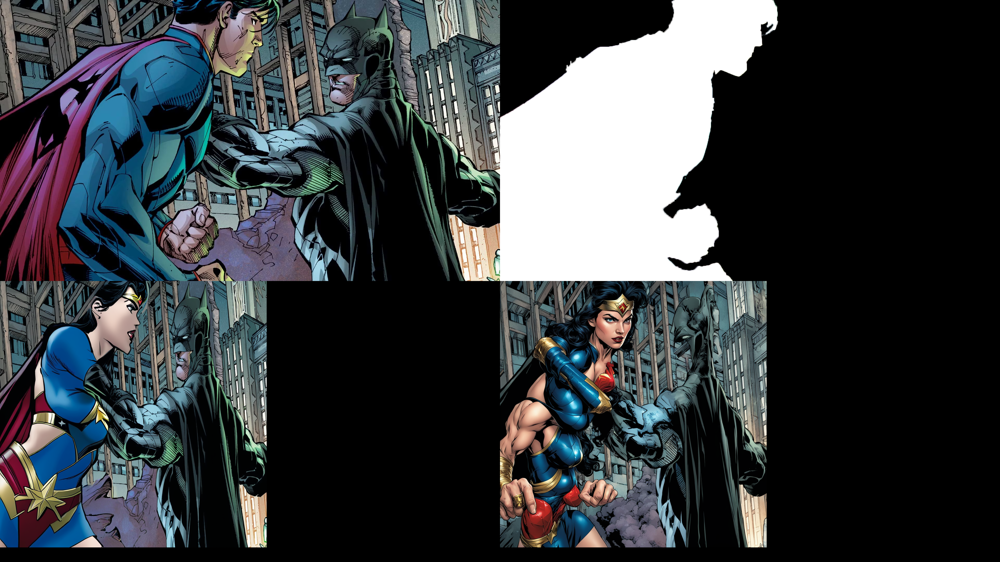

In [7]:
pipeline = AutoPipelineForImage2Image.from_pipe(pipeline)


image = pipeline(prompt=prompt, image=image).images[0]
make_image_grid([init_image, mask_image, image_inpainting, image], rows=2, cols=2)